# ***Train Code***

In [1]:
! pip install torch torchvision opencv-python matplotlib Pillow pytorch-msssim


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 69.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 61.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 50.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 108.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitli

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip install pytorch-msssim --quiet

import os, cv2, torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.optim as optim
from pytorch_msssim import ssim


In [4]:
# Utility: Edge & Segmentation
def get_edge_map(img_np):
    gray = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    edge = np.sqrt(sobelx**2 + sobely**2)
    return np.uint8(np.clip(edge / edge.max() * 255, 0, 255))

def get_seg_map(img_np):
    hsv = cv2.cvtColor(img_np, cv2.COLOR_RGB2HSV)
    return cv2.inRange(hsv, (0, 10, 0), (180, 255, 255))


In [5]:
# Dataset
class BlurDataset(Dataset):
    def __init__(self, folder, use_clahe=False):
        self.files = [os.path.join(folder, f) for f in os.listdir(folder)
                      if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        self.use_clahe = use_clahe
        self.to_tensor = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize([0.5]*3, [0.5]*3)
        ])
        self.resize = transforms.Resize((256, 256))

    def __getitem__(self, idx):
        img = Image.open(self.files[idx]).convert("RGB")
        sharp_np = np.array(img)

        if self.use_clahe:
            lab = cv2.cvtColor(sharp_np, cv2.COLOR_RGB2LAB)
            l, a, b = cv2.split(lab)
            cl = cv2.createCLAHE(3.0, (8, 8)).apply(l)
            sharp_np = cv2.cvtColor(cv2.merge((cl, a, b)), cv2.COLOR_LAB2RGB)

        blur_np = cv2.GaussianBlur(sharp_np, (21, 21), 2.5)
        edge_np = get_edge_map(blur_np)
        seg_np = get_seg_map(blur_np)

        edge_t = torch.from_numpy(np.array(self.resize(Image.fromarray(edge_np)))).unsqueeze(0).float() / 255.0
        seg_t = torch.from_numpy(np.array(self.resize(Image.fromarray(seg_np)))).unsqueeze(0).float() / 255.0

        blur_tensor = self.to_tensor(self.resize(Image.fromarray(blur_np)))
        sharp_tensor = self.to_tensor(self.resize(Image.fromarray(sharp_np)))

        input_tensor = torch.cat([blur_tensor, edge_t, seg_t], dim=0)
        return input_tensor, sharp_tensor

    def __len__(self):
        return len(self.files)


In [6]:
#  U-Net
class UNetSmall(nn.Module):
    def __init__(self):
        super().__init__()
        def C(i, o): return nn.Sequential(
            nn.Conv2d(i, o, 3, 1, 1), nn.InstanceNorm2d(o), nn.ReLU(True),
            nn.Conv2d(o, o, 3, 1, 1), nn.InstanceNorm2d(o), nn.ReLU(True)
        )
        def U(i, o): return nn.ConvTranspose2d(i, o, 2, 2)

        self.e1, self.p1 = C(5, 32), nn.MaxPool2d(2)
        self.e2, self.p2 = C(32, 64), nn.MaxPool2d(2)
        self.e3, self.p3 = C(64, 128), nn.MaxPool2d(2)
        self.bottleneck = C(128, 256)

        self.u3, self.d3 = U(256, 128), C(256, 128)
        self.u2, self.d2 = U(128, 64), C(128, 64)
        self.u1, self.d1 = U(64, 32), C(64, 32)
        self.out = nn.Sequential(nn.Conv2d(32, 3, 1), nn.Tanh())

    def forward(self, x):
        e1 = self.e1(x); e2 = self.e2(self.p1(e1)); e3 = self.e3(self.p2(e2))
        b = self.bottleneck(self.p3(e3))
        d3 = self.d3(torch.cat([self.u3(b), e3], 1))
        d2 = self.d2(torch.cat([self.u2(d3), e2], 1))
        d1 = self.d1(torch.cat([self.u1(d2), e1], 1))
        return self.out(d1)


In [7]:
# Loss & PSNR
def loss_fn(pred, tgt):
    mse = nn.functional.mse_loss(pred, tgt)
    ssim_loss = 1 - ssim(pred, tgt, data_range=2)
    return 0.4 * mse + 0.6 * ssim_loss

def psnr(pred, target):
    mse = nn.functional.mse_loss(pred, target).item()
    return 20 * np.log10(2.0) - 10 * np.log10(mse) if mse > 0 else 100


In [8]:
# Training
def train(data_dir, save_path, output_dir, epochs=250, use_clahe=True):
    os.makedirs(output_dir, exist_ok=True)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    dataset = BlurDataset(data_dir, use_clahe)
    if len(dataset) == 0:
        print(f"❌ Error: No images found in the directory: {data_dir}")
        print("Please ensure the directory exists and contains image files with extensions .jpg, .jpeg, or .png.")
        return

    loader = DataLoader(dataset, batch_size=2, shuffle=True)
    model = UNetSmall().to(device)
    opt = optim.Adam(model.parameters(), lr=1e-4)

    for ep in range(1, epochs + 1):
        model.train()
        total_loss = 0
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            pred = model(xb)
            loss = loss_fn(pred, yb)
            opt.zero_grad(); loss.backward(); opt.step()
            total_loss += loss.item()

        print(f"📚 Epoch {ep:03d}/{epochs} | Loss: {total_loss/len(loader):.5f}")
        if ep % 10 == 0:
            torch.save(model.state_dict(), save_path)

    torch.save(model.state_dict(), save_path)
    print("✅ Model saved at:", save_path)

    # ─────────── Evaluation ─────────── #
    model.eval()
    ssim_total, psnr_total, total_loss = 0, 0, 0
    shown = 0
    for xb, yb in loader:
        xb, yb = xb.to(device), yb.to(device)
        with torch.no_grad():
            pred = model(xb)
        total_loss += loss_fn(pred, yb).item()
        ssim_total += ssim(pred, yb, data_range=2).item()
        psnr_total += psnr(pred, yb)

        for j in range(xb.size(0)):
            if shown >= 10: break
            orig = ((yb[j].permute(1, 2, 0) * 0.5) + 0.5).cpu().numpy()
            blur = ((xb[j][:3].permute(1, 2, 0) * 0.5) + 0.5).cpu().numpy()
            deb  = ((pred[j].permute(1, 2, 0) * 0.5) + 0.5).clamp(0, 1).cpu().numpy()

            merged = np.concatenate([(orig * 255).astype(np.uint8),
                                     (blur * 255).astype(np.uint8),
                                     (deb  * 255).astype(np.uint8)], axis=1)

            fname = os.path.join(output_dir, f"out_{shown}.png")
            cv2.imwrite(fname, cv2.cvtColor(merged, cv2.COLOR_RGB2BGR))

            plt.figure(figsize=(10, 4))
            plt.imshow(merged); plt.axis('off')
            plt.title(f"Original | Blurred | Deblurred - Sample {shown+1}")
            plt.tight_layout(); plt.show()
            shown += 1

    n = len(loader)
    print(f"\n📊 Avg SSIM: {ssim_total/n:.4f} | Avg PSNR: {psnr_total/n:.2f} dB | Avg Loss: {total_loss/n:.5f}")

📚 Epoch 001/250 | Loss: 0.55114
📚 Epoch 002/250 | Loss: 0.38550
📚 Epoch 003/250 | Loss: 0.32965
📚 Epoch 004/250 | Loss: 0.28755
📚 Epoch 005/250 | Loss: 0.25660
📚 Epoch 006/250 | Loss: 0.23568
📚 Epoch 007/250 | Loss: 0.21940
📚 Epoch 008/250 | Loss: 0.20683
📚 Epoch 009/250 | Loss: 0.19676
📚 Epoch 010/250 | Loss: 0.18722
📚 Epoch 011/250 | Loss: 0.18254
📚 Epoch 012/250 | Loss: 0.17706
📚 Epoch 013/250 | Loss: 0.17402
📚 Epoch 014/250 | Loss: 0.17330
📚 Epoch 015/250 | Loss: 0.16541
📚 Epoch 016/250 | Loss: 0.16363
📚 Epoch 017/250 | Loss: 0.15650
📚 Epoch 018/250 | Loss: 0.15235
📚 Epoch 019/250 | Loss: 0.15052
📚 Epoch 020/250 | Loss: 0.14811
📚 Epoch 021/250 | Loss: 0.15007
📚 Epoch 022/250 | Loss: 0.14026
📚 Epoch 023/250 | Loss: 0.13706
📚 Epoch 024/250 | Loss: 0.13555
📚 Epoch 025/250 | Loss: 0.13598
📚 Epoch 026/250 | Loss: 0.13669
📚 Epoch 027/250 | Loss: 0.14058
📚 Epoch 028/250 | Loss: 0.13750
📚 Epoch 029/250 | Loss: 0.13237
📚 Epoch 030/250 | Loss: 0.12866
📚 Epoch 031/250 | Loss: 0.12497
📚 Epoch 

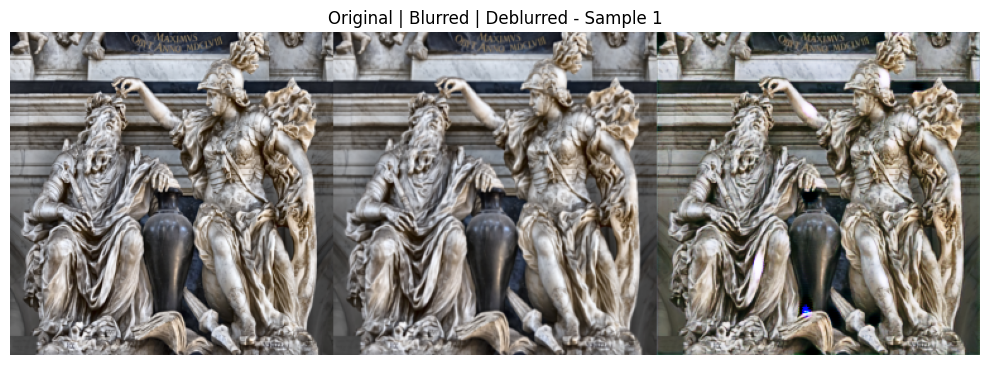

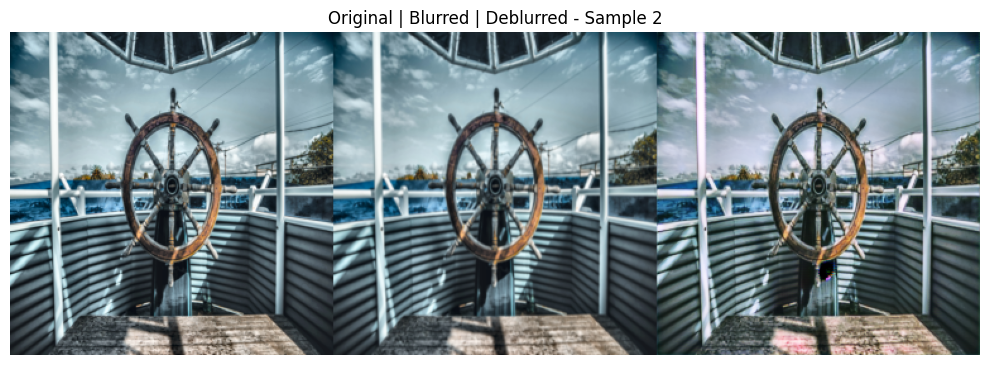

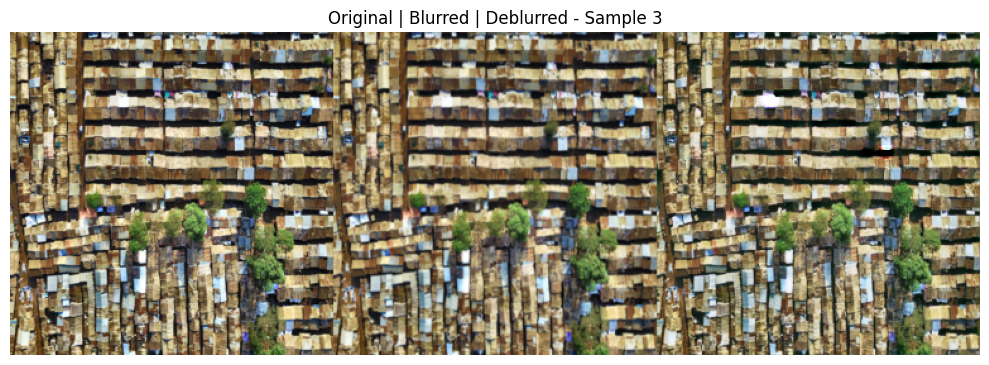

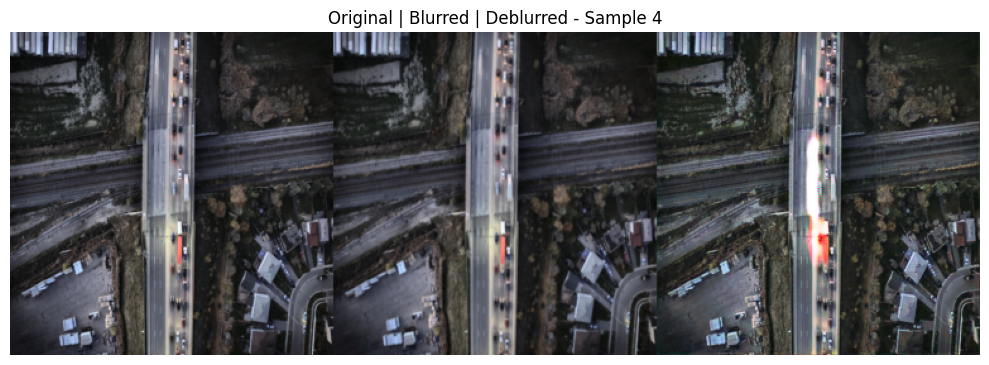

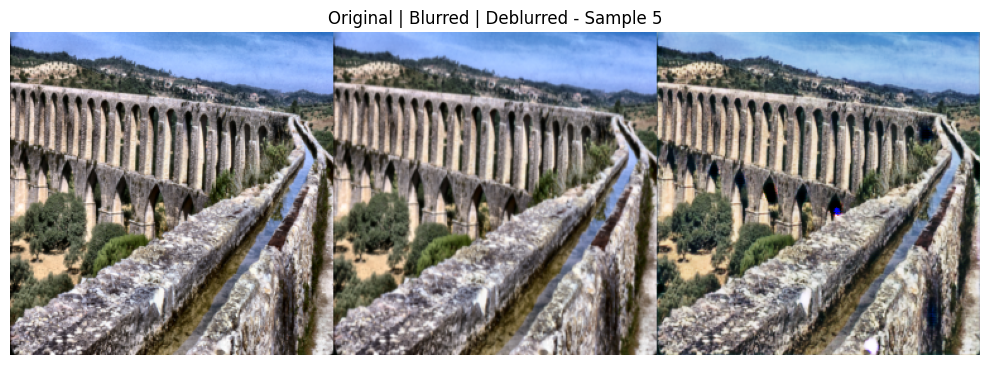

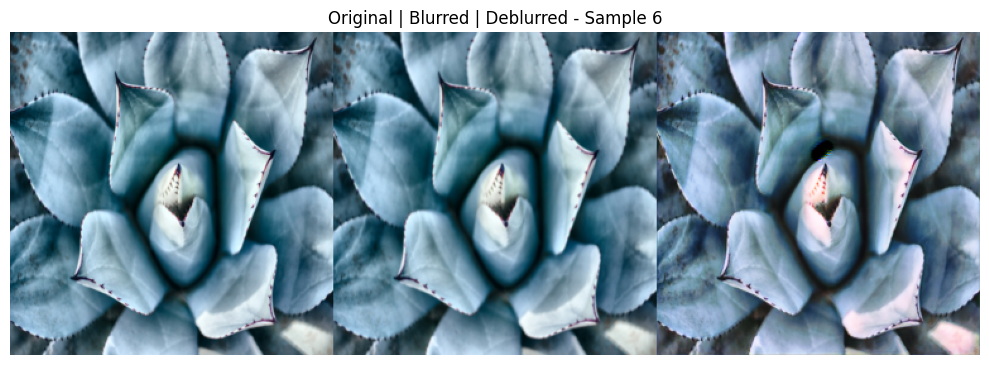

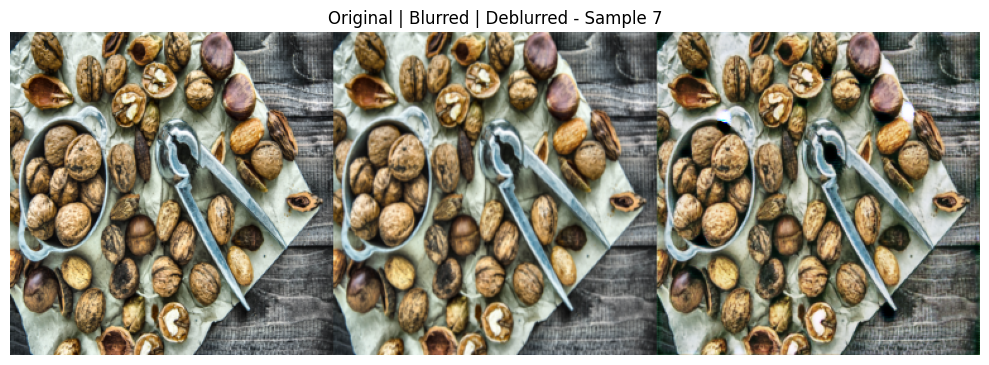

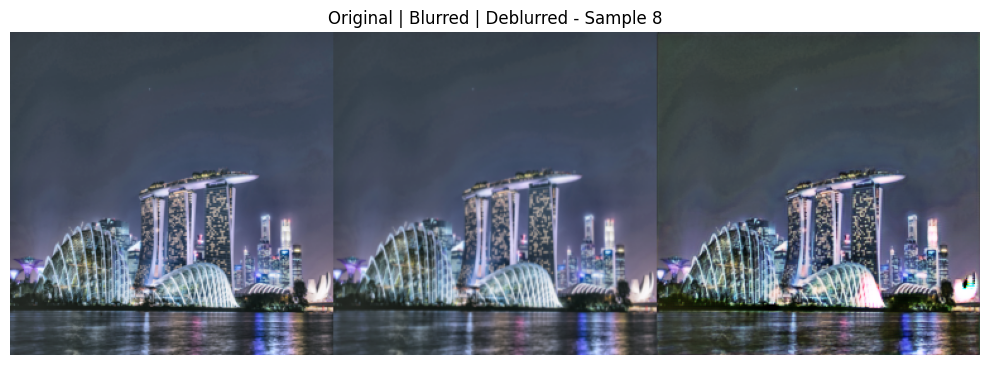

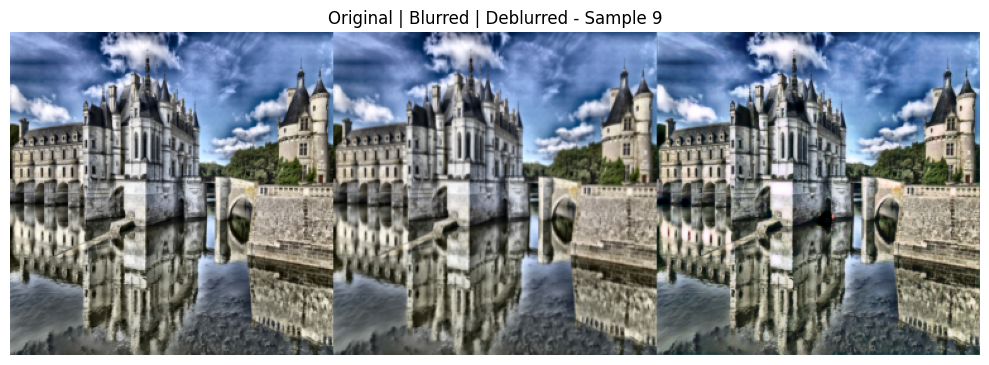

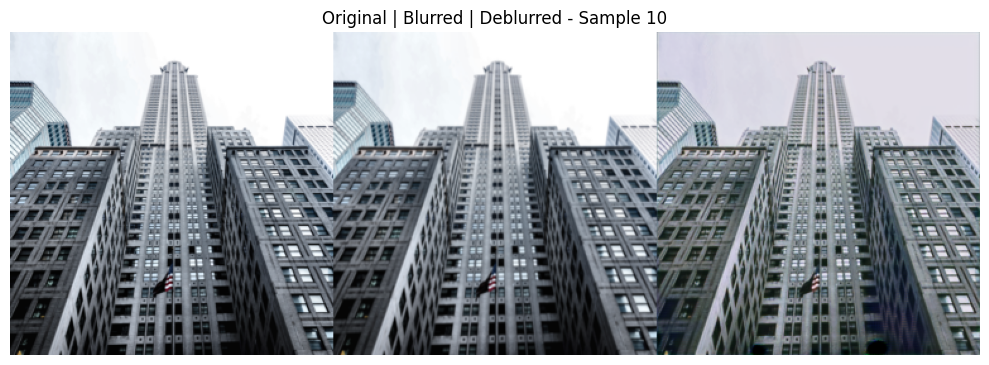


📊 Avg SSIM: 0.9389 | Avg PSNR: 27.66 dB | Avg Loss: 0.04000


In [9]:
# Run
train(
    data_dir="/content/drive/MyDrive/training",
    save_path="/content/drive/MyDrive/training/unet_edge_seg.pt",
    output_dir="/content/drive/MyDrive/training_results",
    epochs=250,
    use_clahe=True
)


# ***Test Code***

In [10]:
import os, cv2, torch
import numpy as np
from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt
import torch.nn as nn


In [11]:
# U-Net Model
class UNetSmall(nn.Module):
    def __init__(self):
        super().__init__()
        def C(i, o): return nn.Sequential(
            nn.Conv2d(i, o, 3, 1, 1), nn.InstanceNorm2d(o), nn.ReLU(True),
            nn.Conv2d(o, o, 3, 1, 1), nn.InstanceNorm2d(o), nn.ReLU(True)
        )
        def U(i, o): return nn.ConvTranspose2d(i, o, 2, 2)

        self.e1, self.p1 = C(5, 32), nn.MaxPool2d(2)
        self.e2, self.p2 = C(32, 64), nn.MaxPool2d(2)
        self.e3, self.p3 = C(64, 128), nn.MaxPool2d(2)
        self.bottleneck = C(128, 256)

        self.u3, self.d3 = U(256, 128), C(256, 128)
        self.u2, self.d2 = U(128, 64), C(128, 64)
        self.u1, self.d1 = U(64, 32), C(64, 32)
        self.out = nn.Sequential(nn.Conv2d(32, 3, 1), nn.Tanh())

    def forward(self, x):
        e1 = self.e1(x); e2 = self.e2(self.p1(e1)); e3 = self.e3(self.p2(e2))
        b = self.bottleneck(self.p3(e3))
        d3 = self.d3(torch.cat([self.u3(b), e3], 1))
        d2 = self.d2(torch.cat([self.u2(d3), e2], 1))
        d1 = self.d1(torch.cat([self.u1(d2), e1], 1))
        return self.out(d1)


In [12]:
# Utility Functions
def get_edge_map(img_np):
    gray = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    edge = np.sqrt(sobelx**2 + sobely**2)
    return np.uint8(np.clip(edge / edge.max() * 255, 0, 255))

def get_seg_map(img_np):
    hsv = cv2.cvtColor(img_np, cv2.COLOR_RGB2HSV)
    return cv2.inRange(hsv, (0, 10, 0), (180, 255, 255))


In [15]:
# Test Function
@torch.no_grad()
def test(model_path, input_dir, output_dir, show_images=True):
    os.makedirs(output_dir, exist_ok=True)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    model = UNetSmall().to(device)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()

    transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize([0.5]*3, [0.5]*3)
    ])

    files = [f for f in os.listdir(input_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    for i, fname in enumerate(files):
        path = os.path.join(input_dir, fname)
        blur_np = np.array(Image.open(path).convert("RGB"))

        edge = get_edge_map(blur_np)
        seg = get_seg_map(blur_np)

        edge_t = torch.from_numpy(cv2.resize(edge, (256, 256))).unsqueeze(0).float() / 255.0
        seg_t = torch.from_numpy(cv2.resize(seg, (256, 256))).unsqueeze(0).float() / 255.0
        blur_t = transform(Image.fromarray(blur_np))

        inp = torch.cat([blur_t, edge_t, seg_t], dim=0).unsqueeze(0).to(device)
        pred = model(inp)[0]
        pred_np = ((pred.permute(1, 2, 0) * 0.5) + 0.5).clamp(0, 1).cpu().numpy()

        merged = np.concatenate([
            cv2.resize(blur_np, (256, 256)),                     # Blurred
            (pred_np * 255).astype(np.uint8)                     # Deblurred
        ], axis=1)

        save_path = os.path.join(output_dir, f"deblur_{i}_{fname}")
        cv2.imwrite(save_path, cv2.cvtColor(merged, cv2.COLOR_RGB2BGR))
        print(f"[{i+1}/{len(files)}] Saved:", save_path)

        if show_images and i < 10:
            plt.figure(figsize=(10, 4))
            plt.imshow(merged)
            plt.axis('off')
            plt.title(f"Blurred | Deblurred - {fname}")
            plt.tight_layout()
            plt.show()


[1/21] Saved: /content/drive/MyDrive/testing_results_edge_seg/deblur_0_images.jpeg


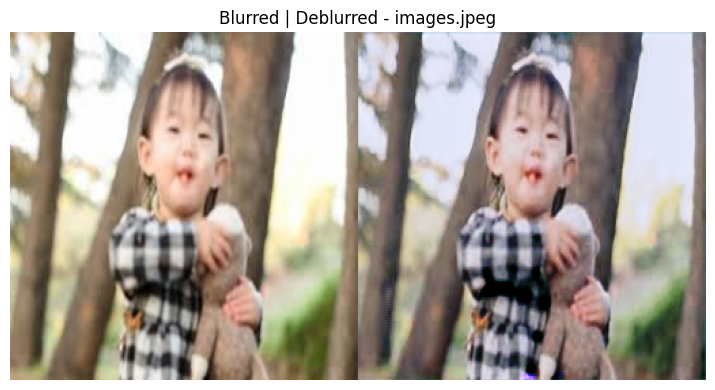

[2/21] Saved: /content/drive/MyDrive/testing_results_edge_seg/deblur_1_images (1).jpeg


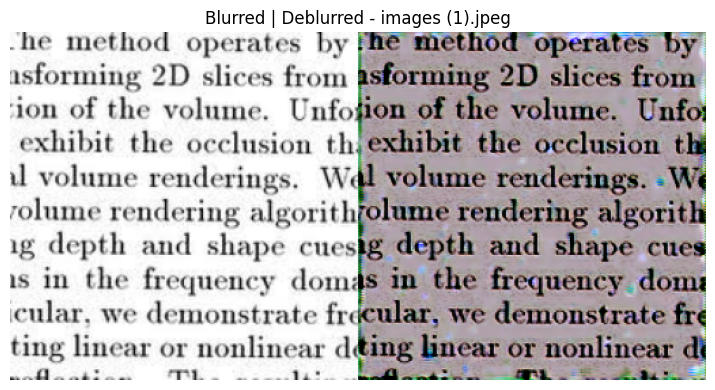

[3/21] Saved: /content/drive/MyDrive/testing_results_edge_seg/deblur_2_images (2).jpeg


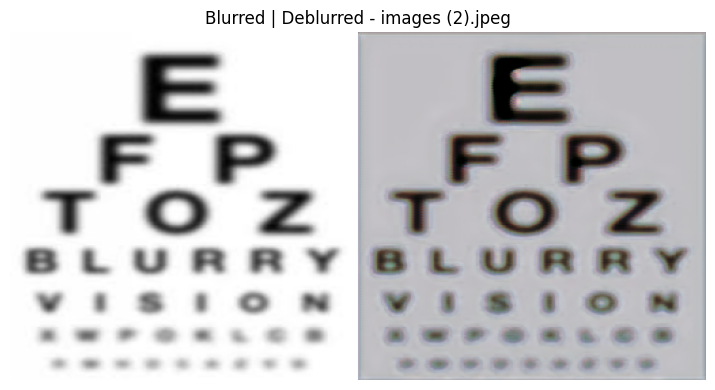

[4/21] Saved: /content/drive/MyDrive/testing_results_edge_seg/deblur_3_images (3).jpeg


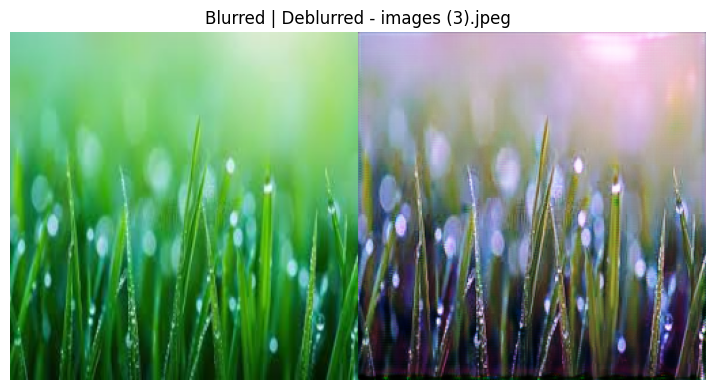

[5/21] Saved: /content/drive/MyDrive/testing_results_edge_seg/deblur_4_23473768-close-up-of-man-twist-angry-male-face-on-blur-background.jpg


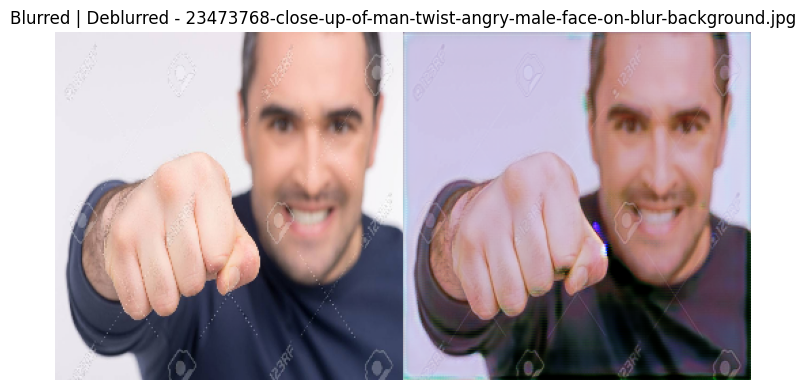

[6/21] Saved: /content/drive/MyDrive/testing_results_edge_seg/deblur_5_10.jpeg


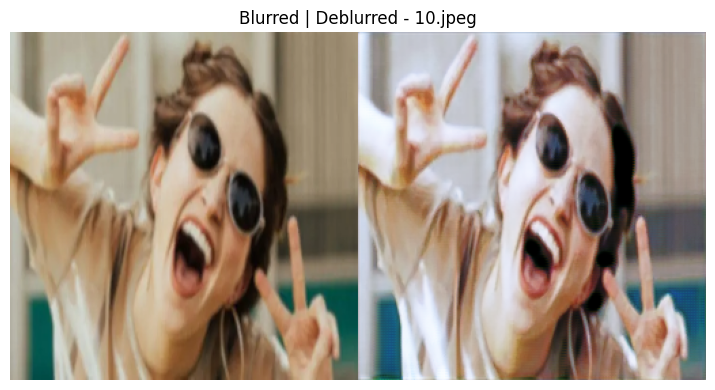

[7/21] Saved: /content/drive/MyDrive/testing_results_edge_seg/deblur_6_06.jpeg


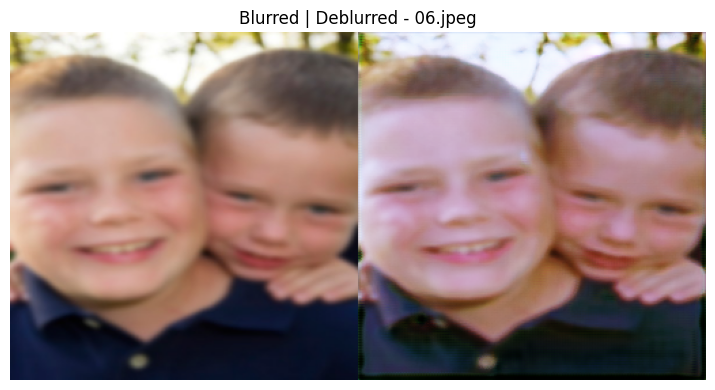

[8/21] Saved: /content/drive/MyDrive/testing_results_edge_seg/deblur_7_09.jpeg


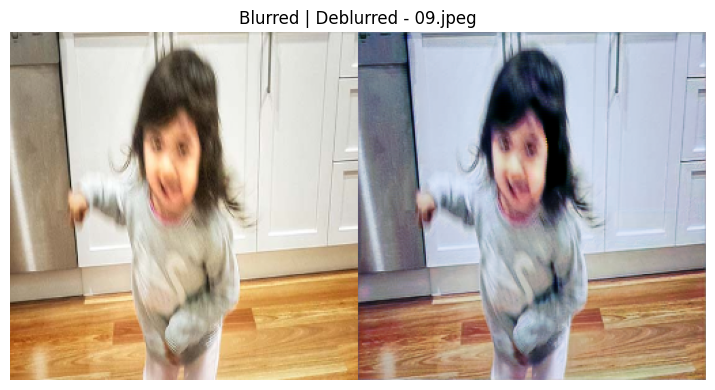

[9/21] Saved: /content/drive/MyDrive/testing_results_edge_seg/deblur_8_03.jpeg


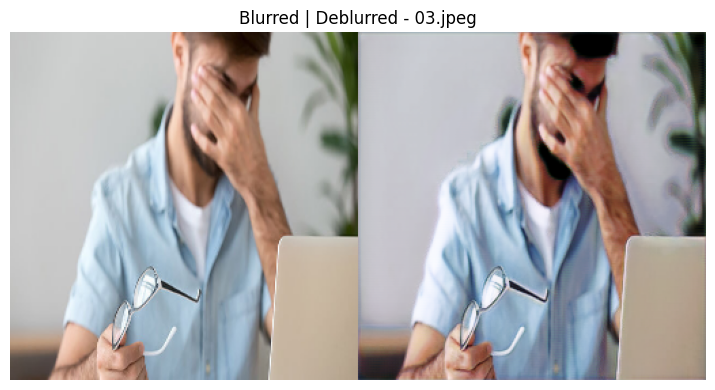

[10/21] Saved: /content/drive/MyDrive/testing_results_edge_seg/deblur_9_08.jpeg


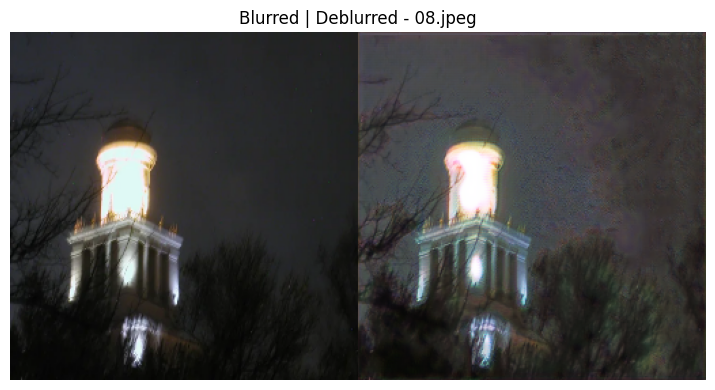

[11/21] Saved: /content/drive/MyDrive/testing_results_edge_seg/deblur_10_07.jpeg
[12/21] Saved: /content/drive/MyDrive/testing_results_edge_seg/deblur_11_05.jpeg
[13/21] Saved: /content/drive/MyDrive/testing_results_edge_seg/deblur_12_04.jpeg
[14/21] Saved: /content/drive/MyDrive/testing_results_edge_seg/deblur_13_02.jpeg
[15/21] Saved: /content/drive/MyDrive/testing_results_edge_seg/deblur_14_01.jpeg
[16/21] Saved: /content/drive/MyDrive/testing_results_edge_seg/deblur_15_sizes_KdFqmPGndsNIEkvMG661_1ePdbJCTosCyj594iwcY_1600.jpg
[17/21] Saved: /content/drive/MyDrive/testing_results_edge_seg/deblur_16_couple-before-02.jpg
[18/21] Saved: /content/drive/MyDrive/testing_results_edge_seg/deblur_17_images (7).jpeg
[19/21] Saved: /content/drive/MyDrive/testing_results_edge_seg/deblur_18_Dizzy-woman-holding-her-head-1024x672.jpg
[20/21] Saved: /content/drive/MyDrive/testing_results_edge_seg/deblur_19_images (8).jpeg
[21/21] Saved: /content/drive/MyDrive/testing_results_edge_seg/deblur_20_image

In [16]:
# Entry
test(
    model_path="/content/drive/MyDrive/test/unet_edge_seg.pt",
    input_dir="/content/drive/MyDrive/testing",
    output_dir="/content/drive/MyDrive/testing_results_edge_seg",
    show_images=True
)
